# Imports and custom functions

In [88]:
import pandas as pd
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objects as go
plotly.offline.init_notebook_mode(connected=True)
import matplotlib.pyplot as plt

In [89]:
def prepare_df(df_path, df_name):

    """Read in information from dataframe"""

    # read in df1
    df = pd.read_csv(df_path, header=0, sep="\t")
    # Mark significants
    df["Significant"]  = "No"
    df.loc[(df["FDR"] < 0.05) & (df["logCPM"]>2), "Significant"] = "FDR<0.05\nlogCPM>2"
    # set id as index
    df.set_index("id", inplace=True)
    # rename columns
    df.columns = df.columns + "_" + df_name
    # reset index
    df.reset_index(inplace=True)

    return df

In [90]:
def plot_MA(df, df_name):

    """Plot MA"""

    sns.set(font_scale=2)
    sns_plot = sns.lmplot(x=f"logCPM_{df_name}",
                          y=f"logFC_{df_name}",
                          data=df,
                          fit_reg=False,
                          hue=f"Significant_{df_name}",
                          palette=["black", "red"],
                          height=15,
                          aspect=1)
    ax = plt.gca()
    ax.set_title(f"MA plot for {df_name}")

In [91]:
def merge_df(df_1, df_2):
    
    """Merge dataframes"""
    
    df = pd.merge(df_1, df_2, on="id")
    df["Significant"] = "No"
    return df

In [92]:
def plot_FC_correlation(df, FC_1_name, FC_2_name, hue, hue_order):

    """Plot correlation between FCs"""

    sns.set(font_scale=2)
    sns_plot = sns.lmplot(x=f"logFC_{FC_1_name}",
                          y=f"logFC_{FC_2_name}",
                          data=df,
                          fit_reg=False,
                          hue=hue,
                          hue_order=hue_order,
                          palette=["black", "yellow", "blue", "green"],
                          height=15,
                          aspect=1)
    ax = plt.gca()
    ax.set_title(f"FCs between {FC_1_name} and {FC_2_name}")

In [93]:
def compare(df_1_path, df_2_path, df_1_name, df_2_name):
    
    "Combine multiple functions"
    
    df_1 = prepare_df(df_1_path, df_1_name)
    plot_MA(df_1, df_1_name)
    df_2 = prepare_df(df_2_path, df_2_name)
    plot_MA(df_2, df_2_name)
    
    df_merged = merge_df(df_1, df_2)
    
#     plot_FC_correlation(df_merged, df_1_name, df_2_name, hue="Significant")
#     plot_FC_correlation(df_merged, df_1_name, df_2_name, hue="Significant_" + df_1_name)
#     plot_FC_correlation(df_merged, df_1_name, df_2_name, hue="Significant_" + df_2_name)
    
    return df_merged

# Input files

In [94]:
ip_path = "../WAGO_3_IP/results/DE__N2_Input_Rpph__N2_xf119_Rpph/plot_small_RNAs/22G.tsv"
ip_name = "WAGO-3"

Dpf_3_null_path = "../small_RNA_seq_15_C/results/DE__WT_dpf3__Dpf_3_null/plot_small_RNAs/22G.tsv"
Dpf_3_null_name = "Dpf_3_null"

Dpf_3_S784A_path = "../small_RNA_seq_15_C/results/DE__WT_dpf3__Dpf_3_S784A//plot_small_RNAs/22G.tsv"
Dpf_3_S784A_name = "Dpf_3_S784A"

mut_2_path = "../small_RNA_seq_15_C/results/DE__WT_other__mut_2/plot_small_RNAs/22G.tsv"
mut_2_name = "mut_2"

mut_7_path = "../small_RNA_seq_15_C/results/DE__WT_other__mut_7/plot_small_RNAs/22G.tsv"
mut_7_name = "mut_7"

Dpf_3_null_first_path = "../small_RNA_seq_15_C/results/DE__WT_dpf3_first__Dpf_3_null/plot_small_RNAs/22G.tsv"
Dpf_3_null_first_name = "Dpf_3_null_first"

Dpf_3_S784A_second_path = "../small_RNA_seq_15_C/results/DE__WT_dpf3_second__Dpf_3_S784A/plot_small_RNAs/22G.tsv"
Dpf_3_S784A_second_name = "Dpf_3_S784A_second"

Dpf_3_null_old_path = "../small_RNA_seq_25_C/results/DE__WT__dpf_3_delta/plot_small_RNAs/22G.tsv"
Dpf_3_null_old_name = "Dpf_3_null_old"

dpf_3S784A_old_path = "../small_RNA_seq_25_C/results/DE__WT__dpf_3S784A/plot_small_RNAs/22G.tsv"
dpf_3S784A_old_name = "Dpf_3_S784A_old"

# Comparisons

## 1. IP vs Dpf_3_null

,Significant
No,217464
FDR_WAGO-3<0.05\nlogCPM_WAGO-3>2,10889
FDR_WAGO-3<0.05\nFDR_Dpf_3_null<0.05\nlogCPM_WAGO-3>2\nlogCPM_Dpf_3_null>2,1824
FDR_Dpf_3_null<0.05\nlogCPM_Dpf_3_null>2,1446


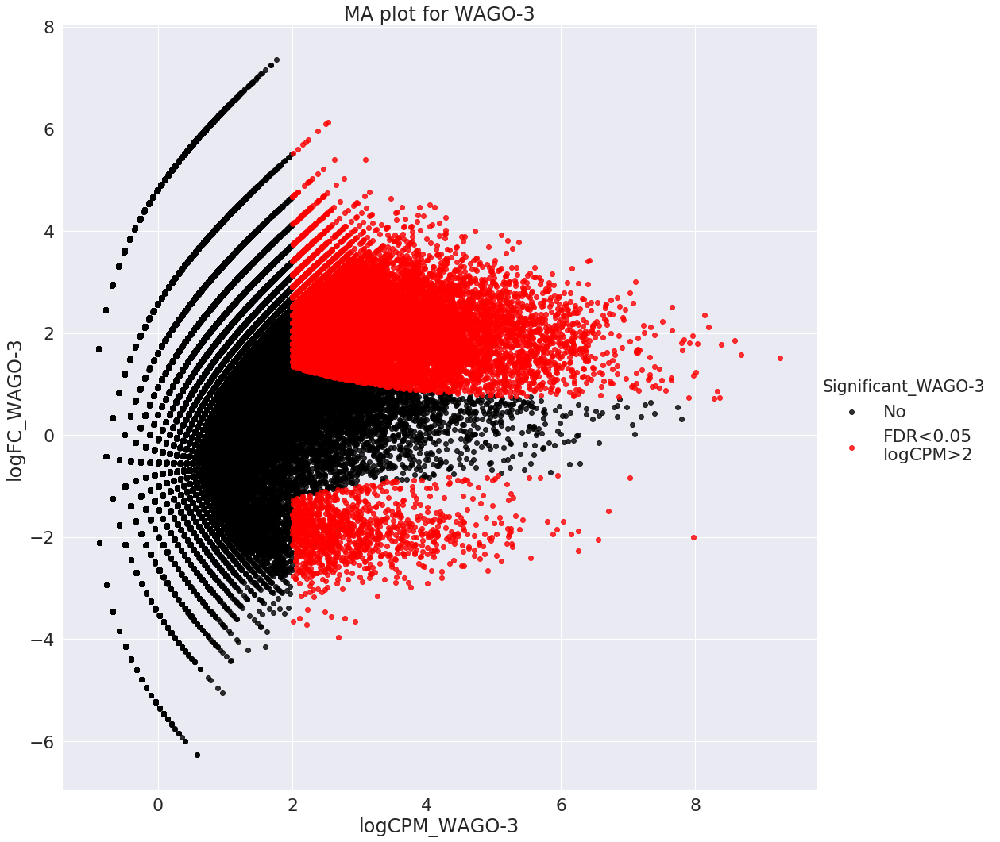

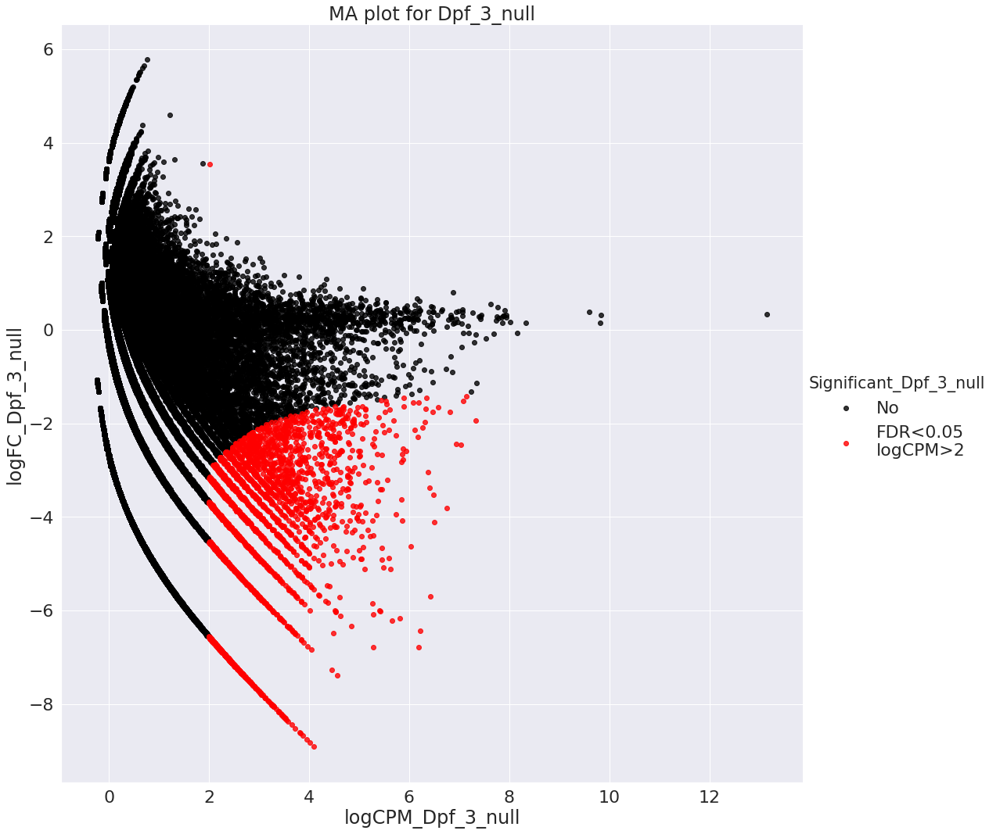

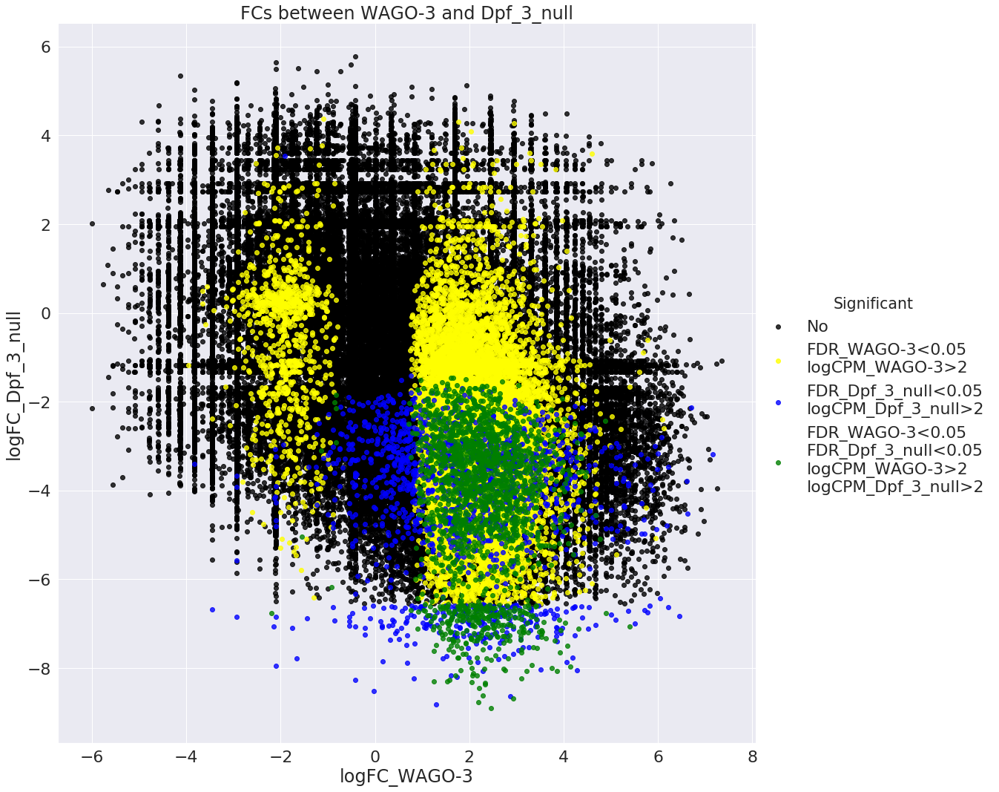

In [95]:
df_1_path = ip_path
df_2_path = Dpf_3_null_path
df_1_name = ip_name
df_2_name = Dpf_3_null_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 2. IP vs Dpf_3_S784A

,Significant
No,202355
FDR_WAGO-3<0.05\nlogCPM_WAGO-3>2,10468
FDR_WAGO-3<0.05\nFDR_Dpf_3_S784A<0.05\nlogCPM_WAGO-3>2\nlogCPM_Dpf_3_S784A>2,2185
FDR_Dpf_3_S784A<0.05\nlogCPM_Dpf_3_S784A>2,1829


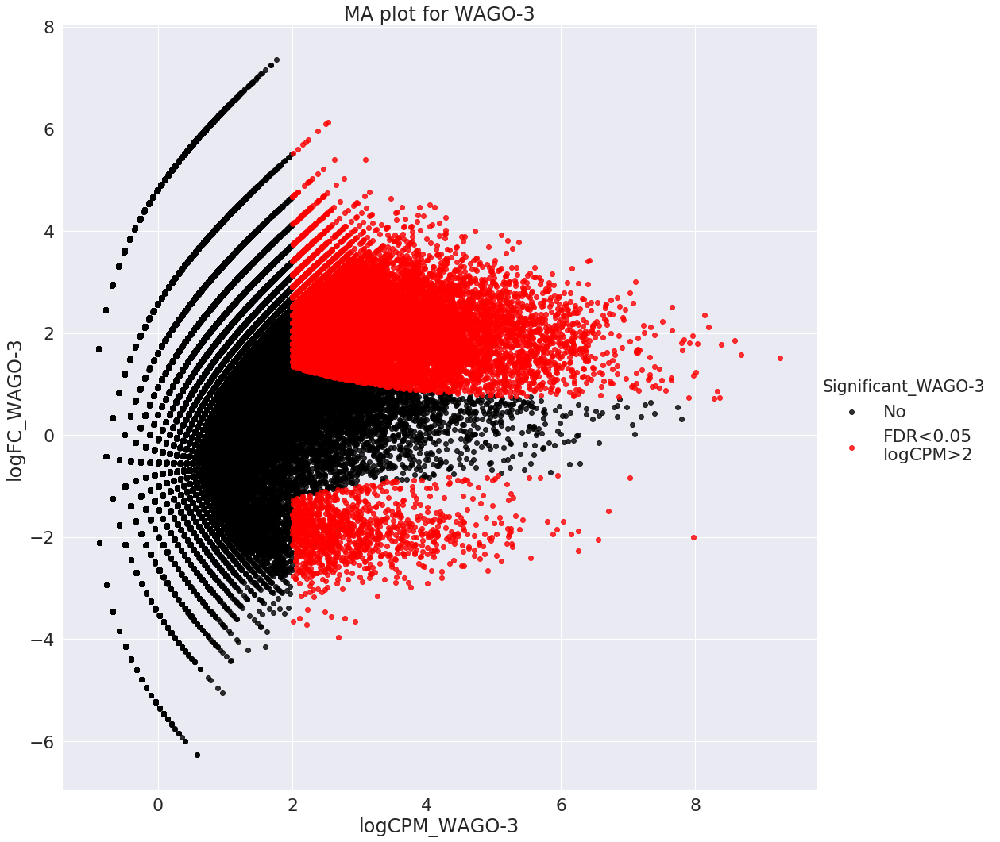

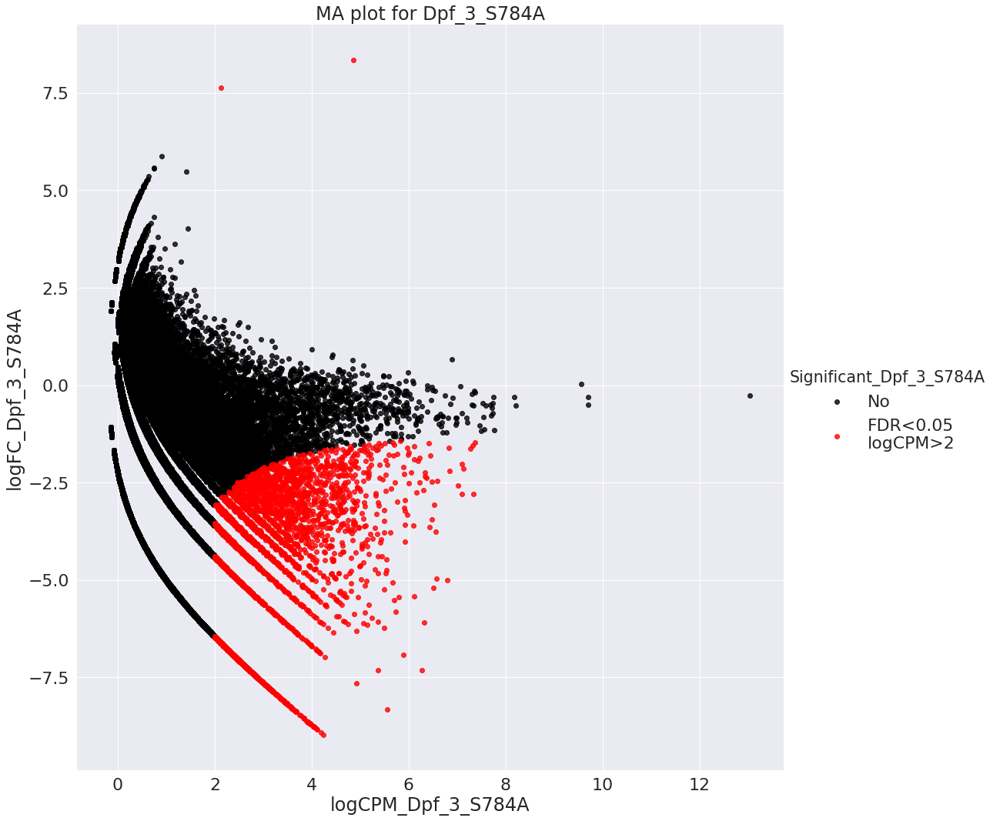

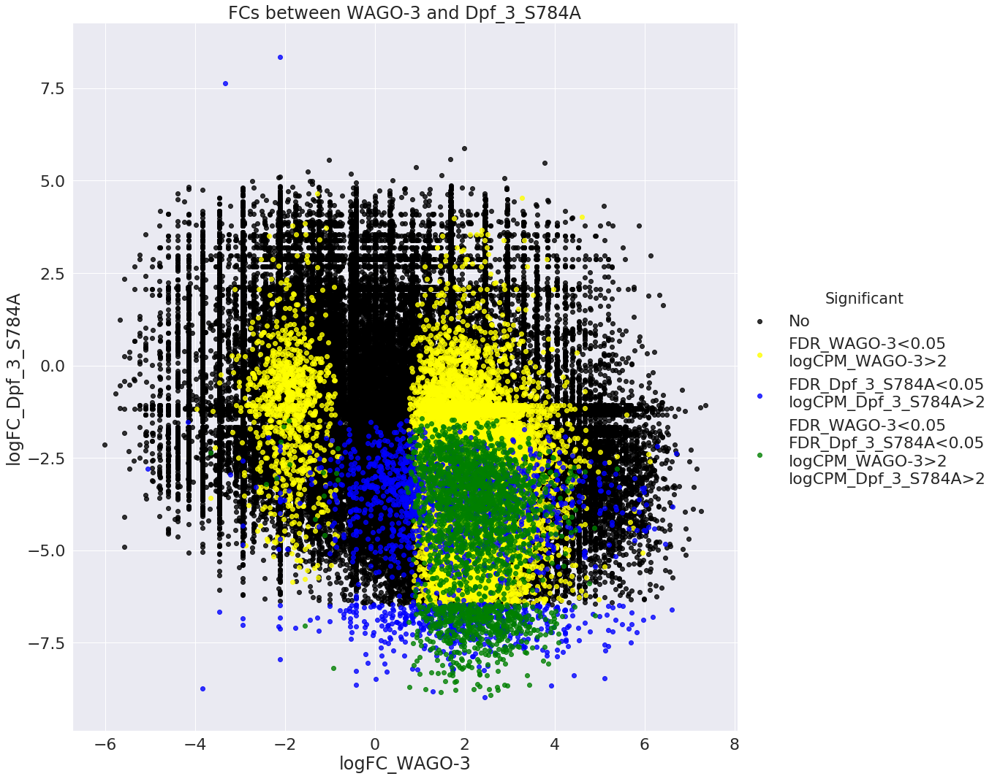

In [96]:
df_1_path = ip_path
df_2_path = Dpf_3_S784A_path
df_1_name = ip_name
df_2_name = Dpf_3_S784A_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 3. IP vs mut_2

,Significant
No,181721
FDR_WAGO-3<0.05\nlogCPM_WAGO-3>2,8851
FDR_mut_2<0.05\nlogCPM_mut_2>2,3292
FDR_WAGO-3<0.05\nFDR_mut_2<0.05\nlogCPM_WAGO-3>2\nlogCPM_mut_2>2,3235


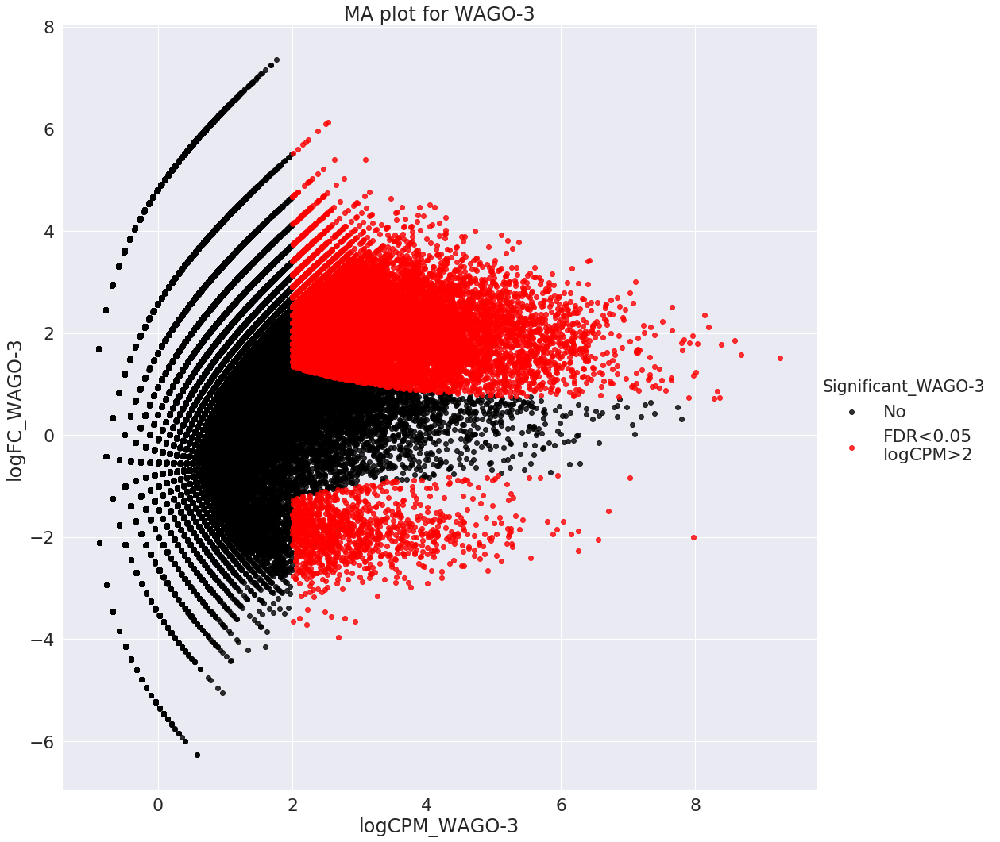

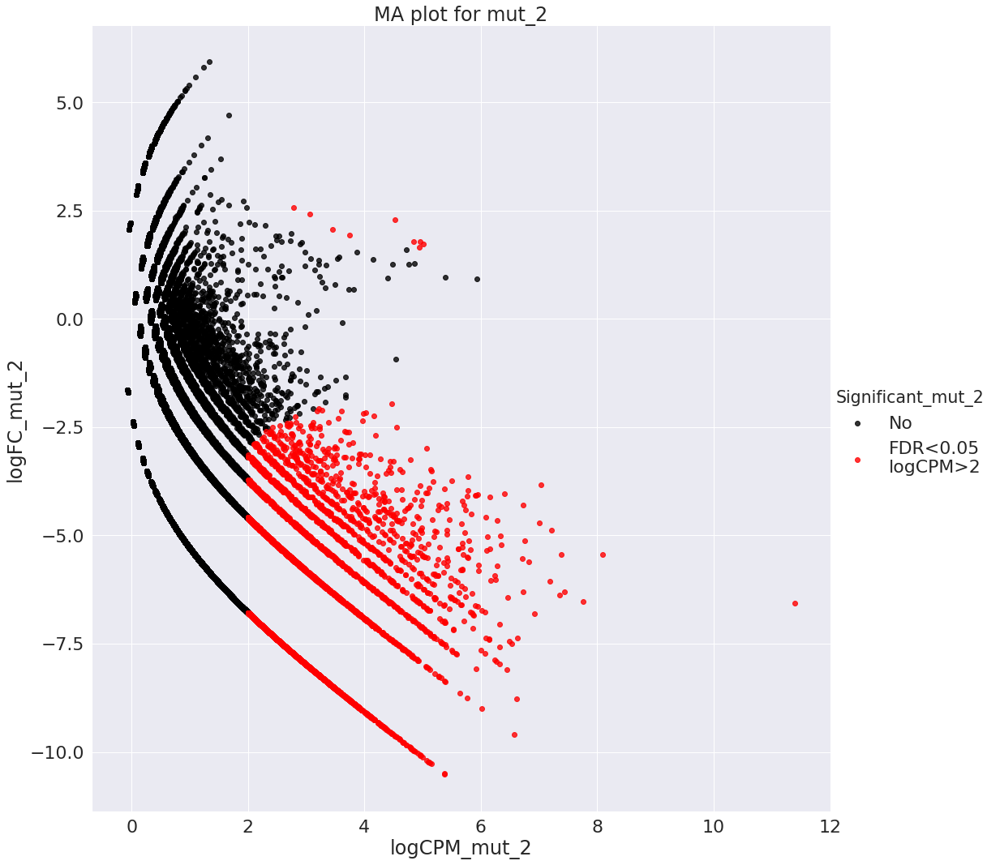

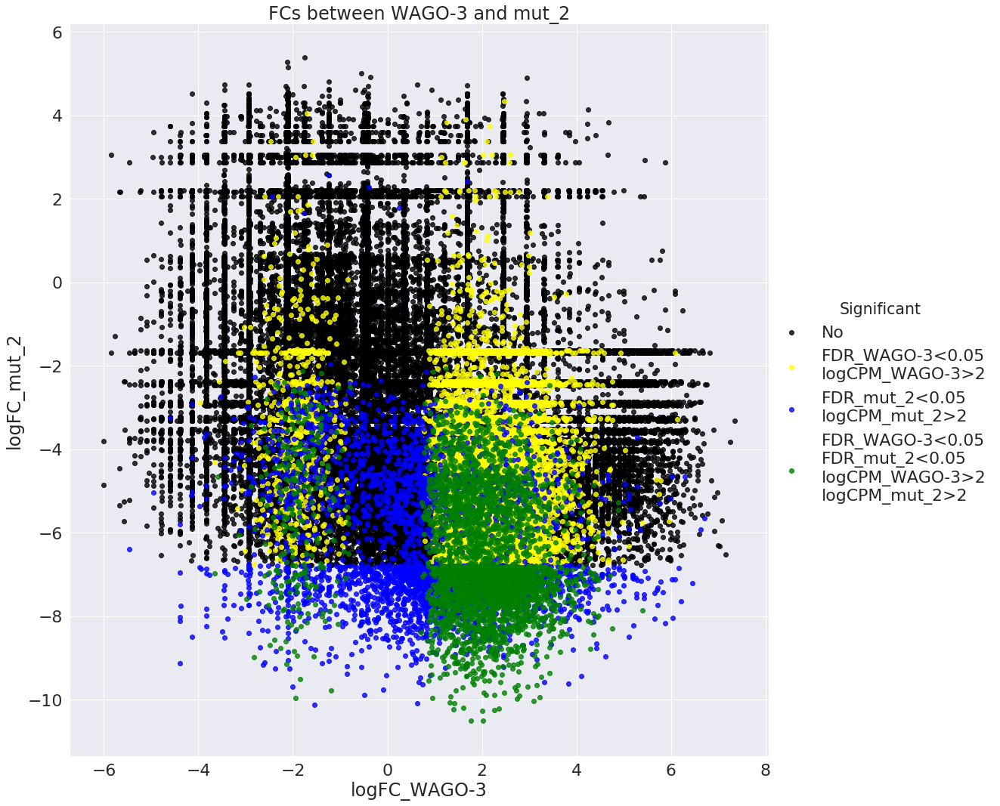

In [97]:
df_1_path = ip_path
df_2_path = mut_2_path
df_1_name = ip_name
df_2_name = mut_2_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 4. IP vs mut_7

,Significant
No,187787
FDR_WAGO-3<0.05\nlogCPM_WAGO-3>2,9491
FDR_WAGO-3<0.05\nFDR_mut_7<0.05\nlogCPM_WAGO-3>2\nlogCPM_mut_7>2,2579
FDR_mut_7<0.05\nlogCPM_mut_7>2,2090


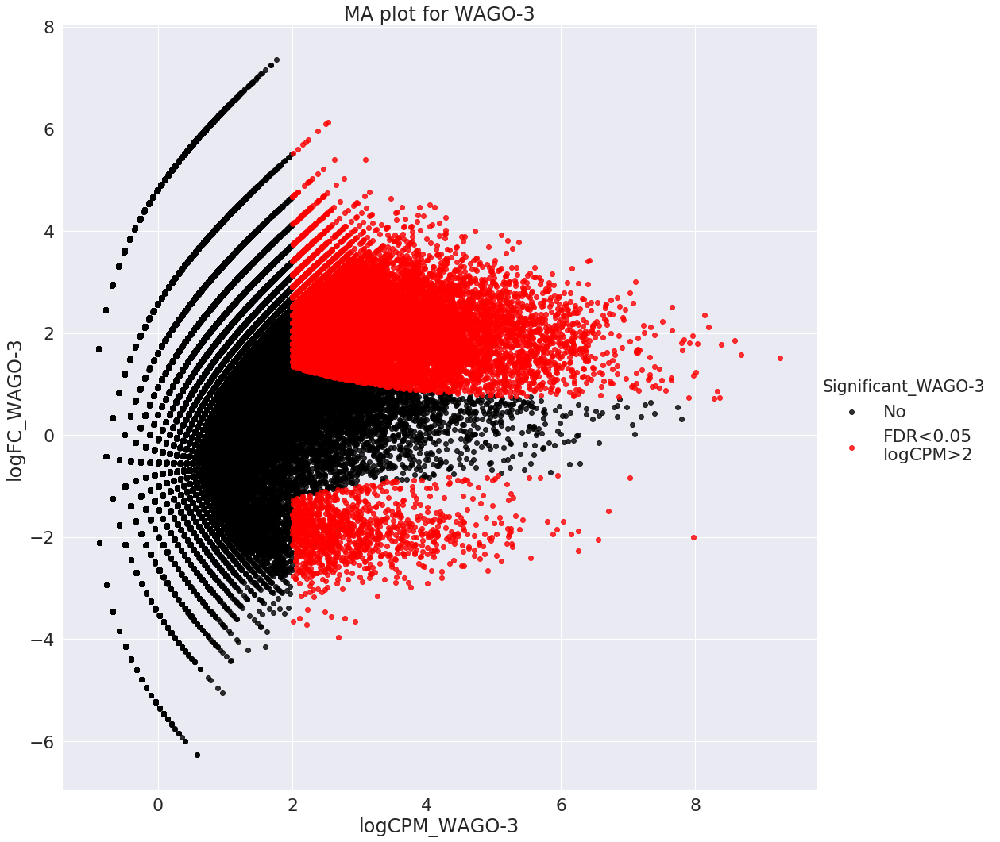

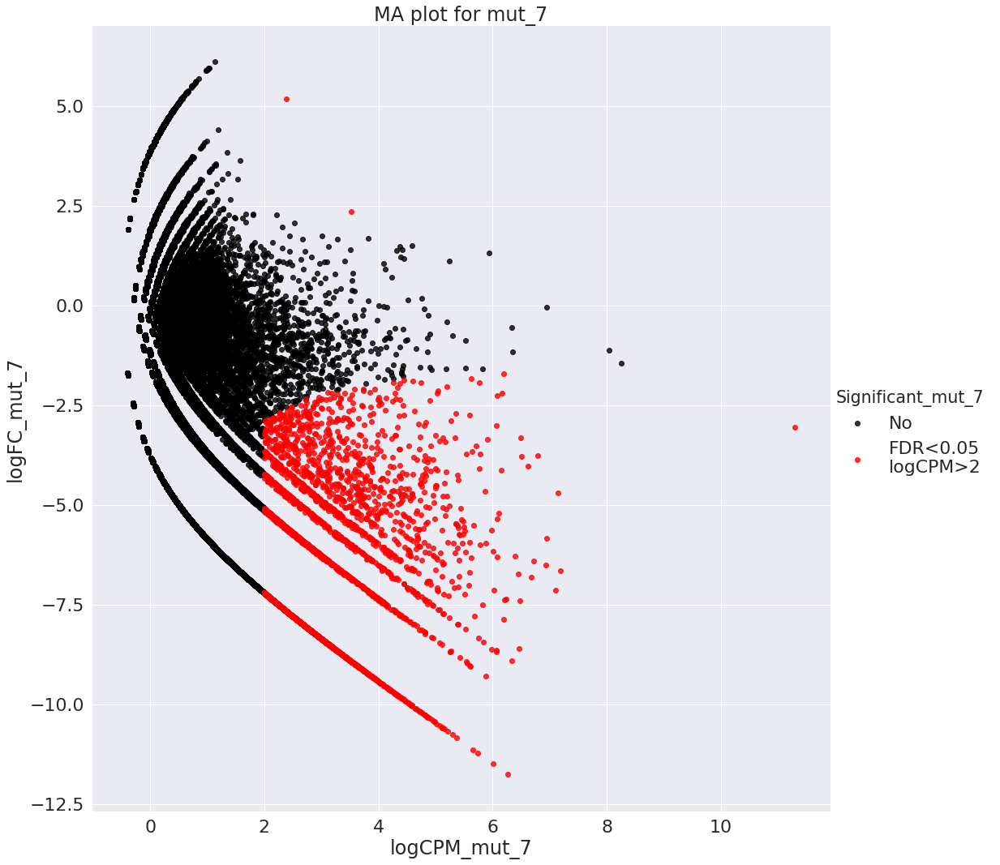

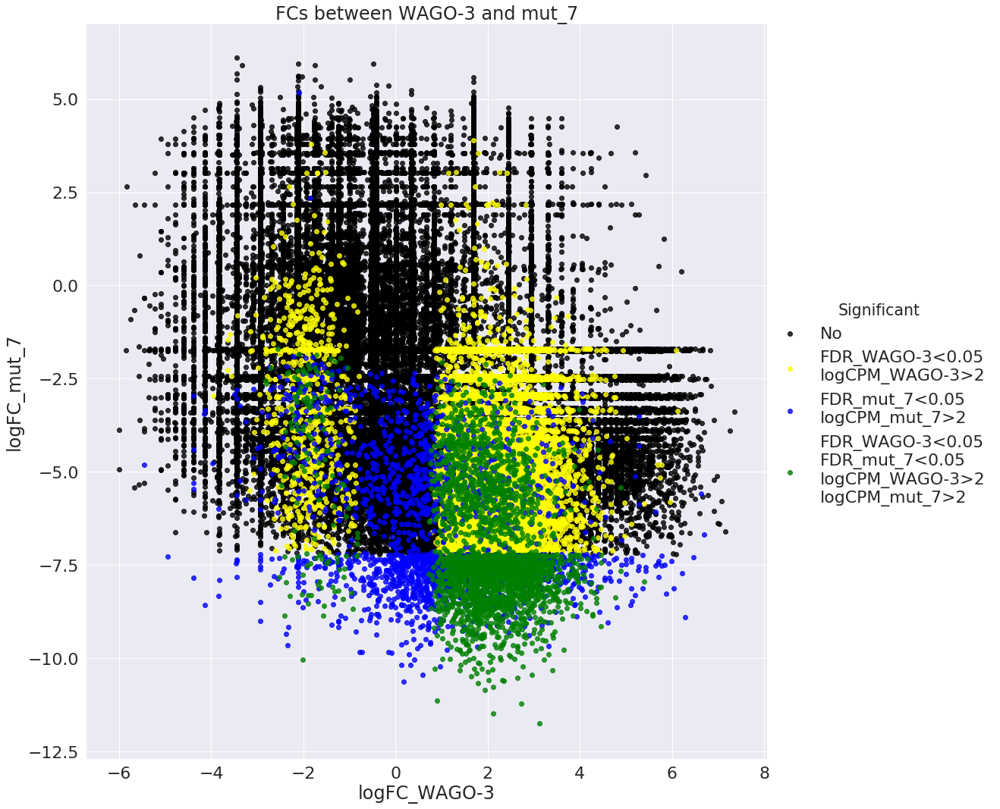

In [98]:
df_1_path = ip_path
df_2_path = mut_7_path
df_1_name = ip_name
df_2_name = mut_7_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 5.a. Dpf_3_null vs Dpf_3_S784A with same WTs (It's wrong but I leave it, just to see the differences)

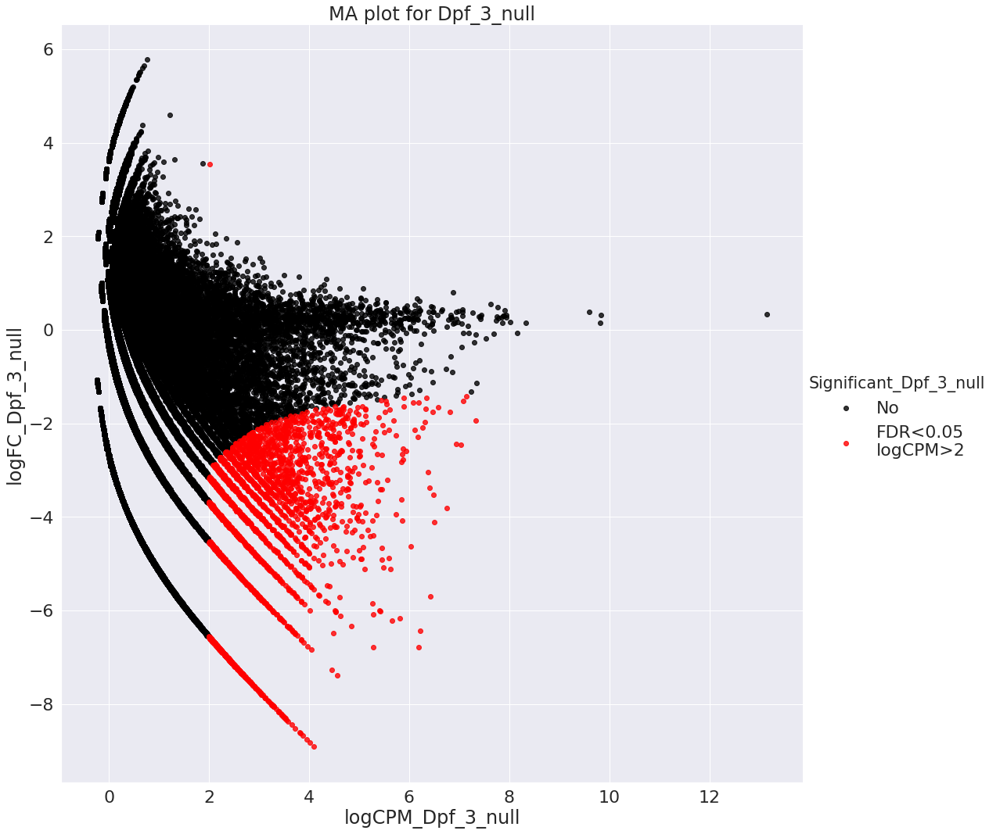

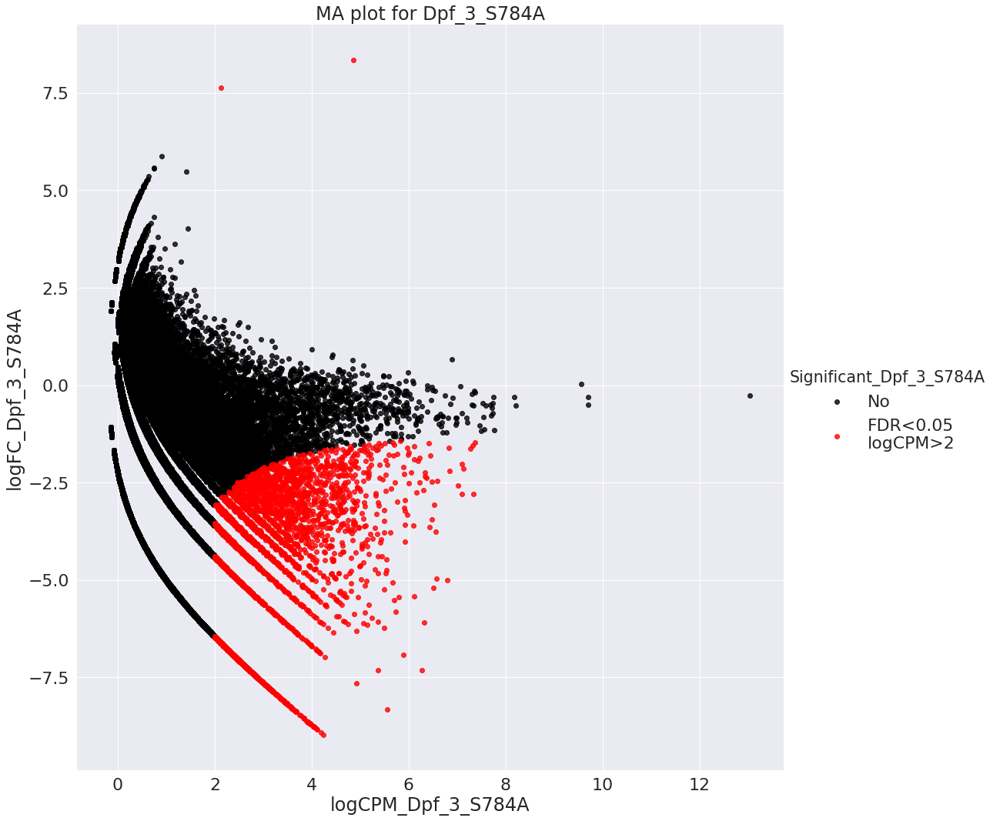

In [104]:
df_1_path = Dpf_3_null_path
df_2_path = Dpf_3_S784A_path
df_1_name = Dpf_3_null_name
df_2_name = Dpf_3_S784A_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,356378
FDR_Dpf_3_null<0.05\nFDR_Dpf_3_S784A<0.05\nlogCPM_Dpf_3_null>2\nlogCPM_Dpf_3_S784A>2,3073
FDR_Dpf_3_S784A<0.05\nlogCPM_Dpf_3_S784A>2,986
FDR_Dpf_3_null<0.05\nlogCPM_Dpf_3_null>2,235


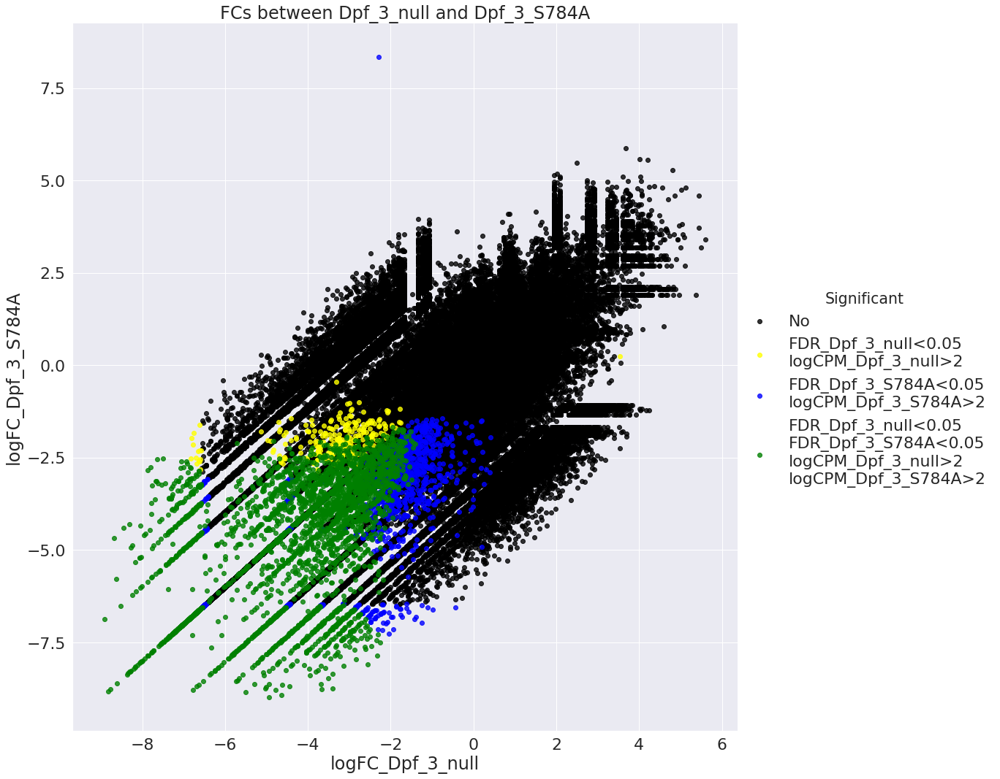

In [105]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 5.b. Dpf_3_null vs Dpf_3_S784A with different WTs

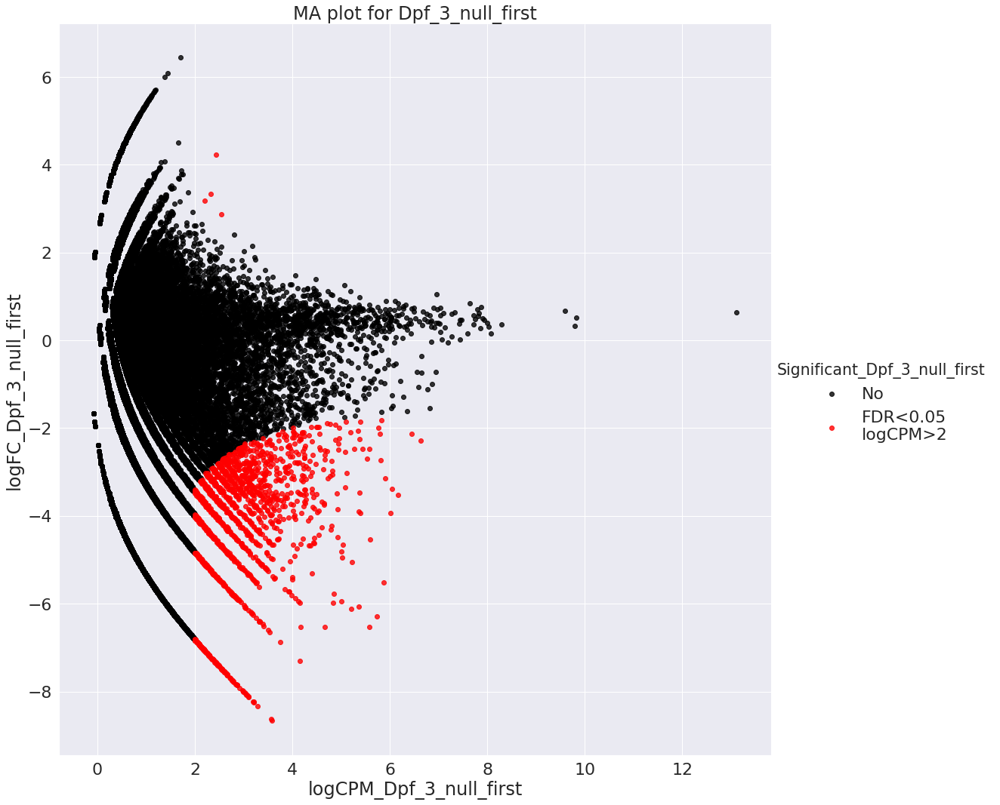

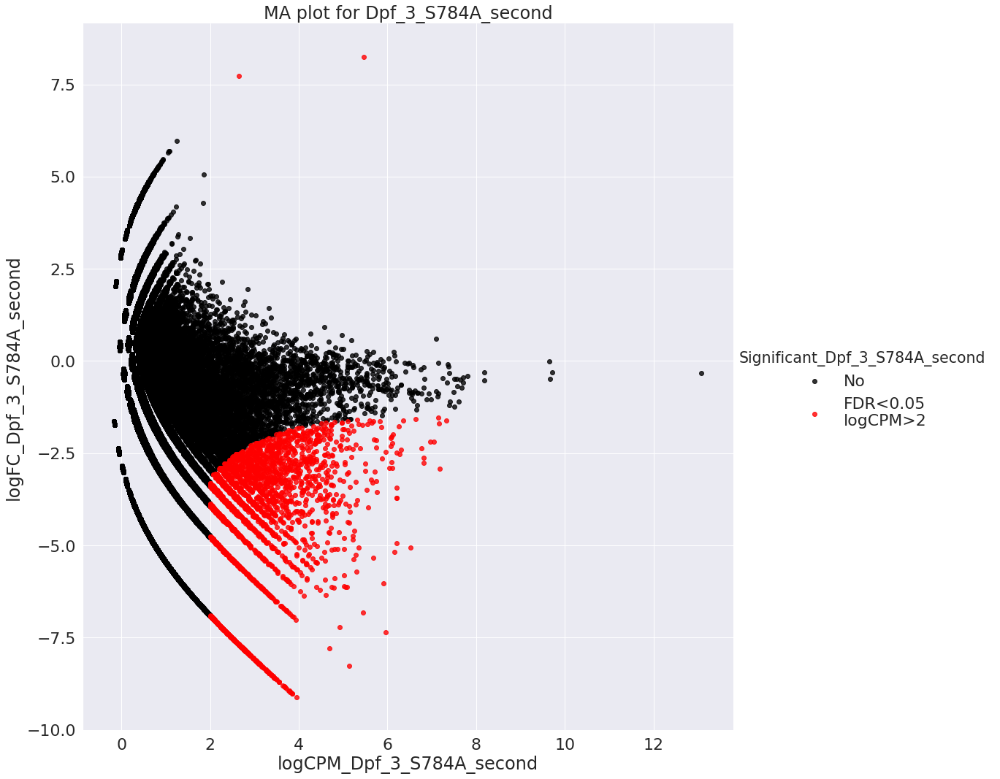

In [106]:
df_1_path = Dpf_3_null_first_path
df_2_path = Dpf_3_S784A_second_path
df_1_name = Dpf_3_null_first_name
df_2_name = Dpf_3_S784A_second_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,144114
FDR_Dpf_3_S784A_second<0.05\nlogCPM_Dpf_3_S784A_second>2,1519
FDR_Dpf_3_null_first<0.05\nFDR_Dpf_3_S784A_second<0.05\nlogCPM_Dpf_3_null_first>2\nlogCPM_Dpf_3_S784A_second>2,1513
FDR_Dpf_3_null_first<0.05\nlogCPM_Dpf_3_null_first>2,212


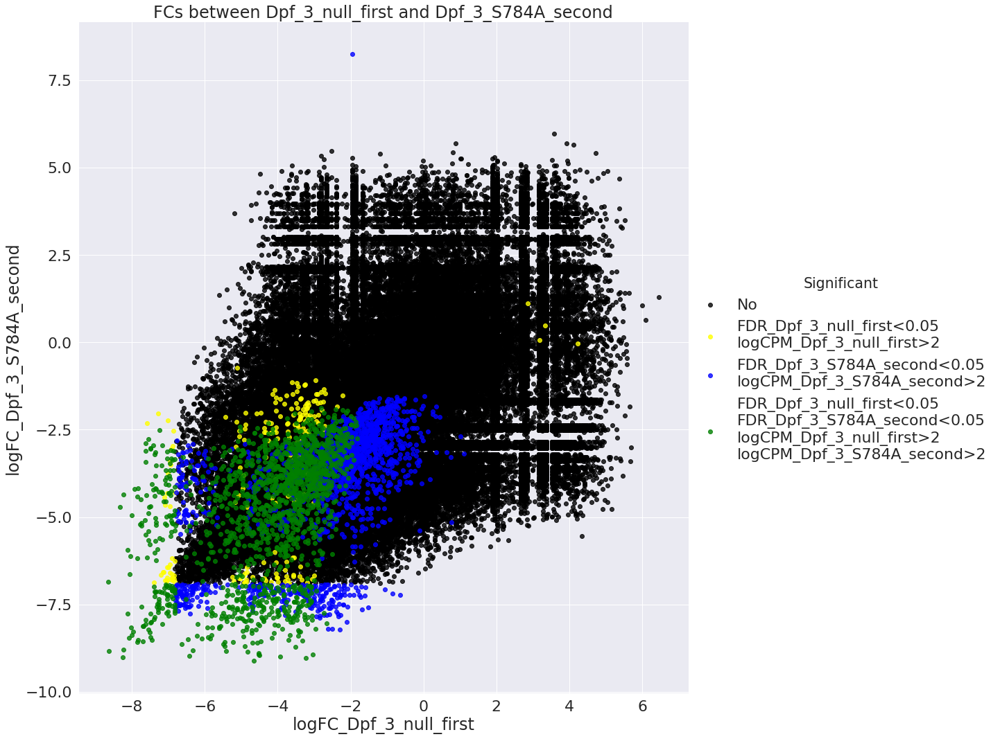

In [107]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 6. Dpf_3_null vs mut_2

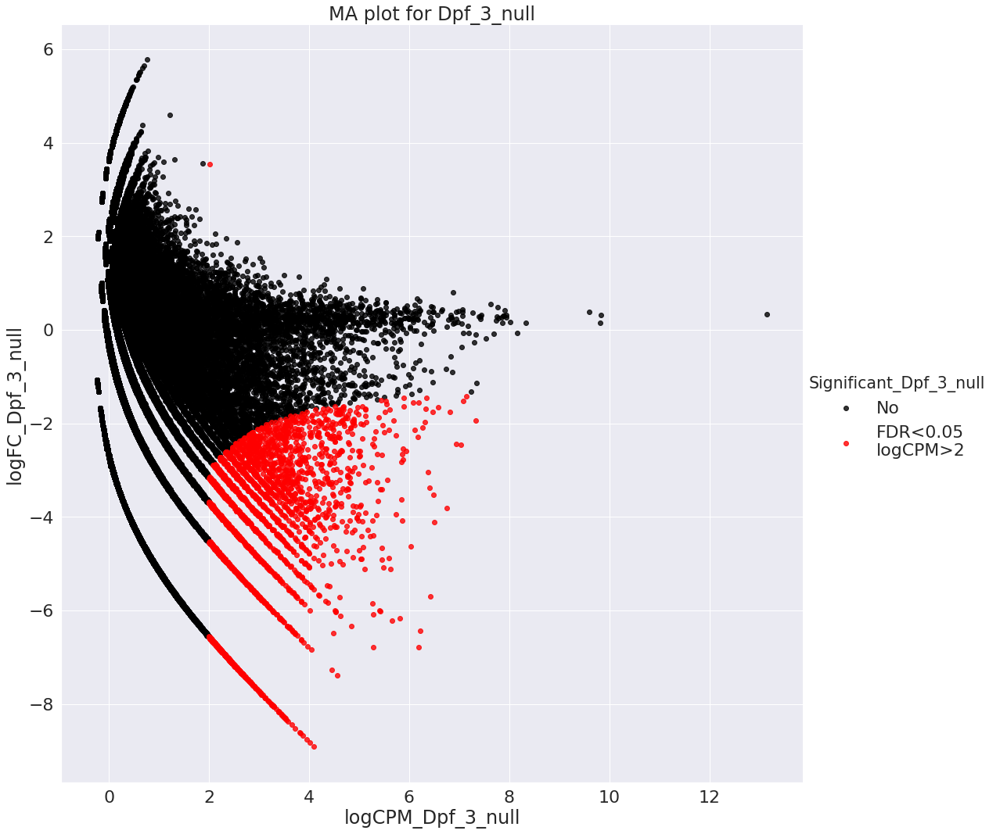

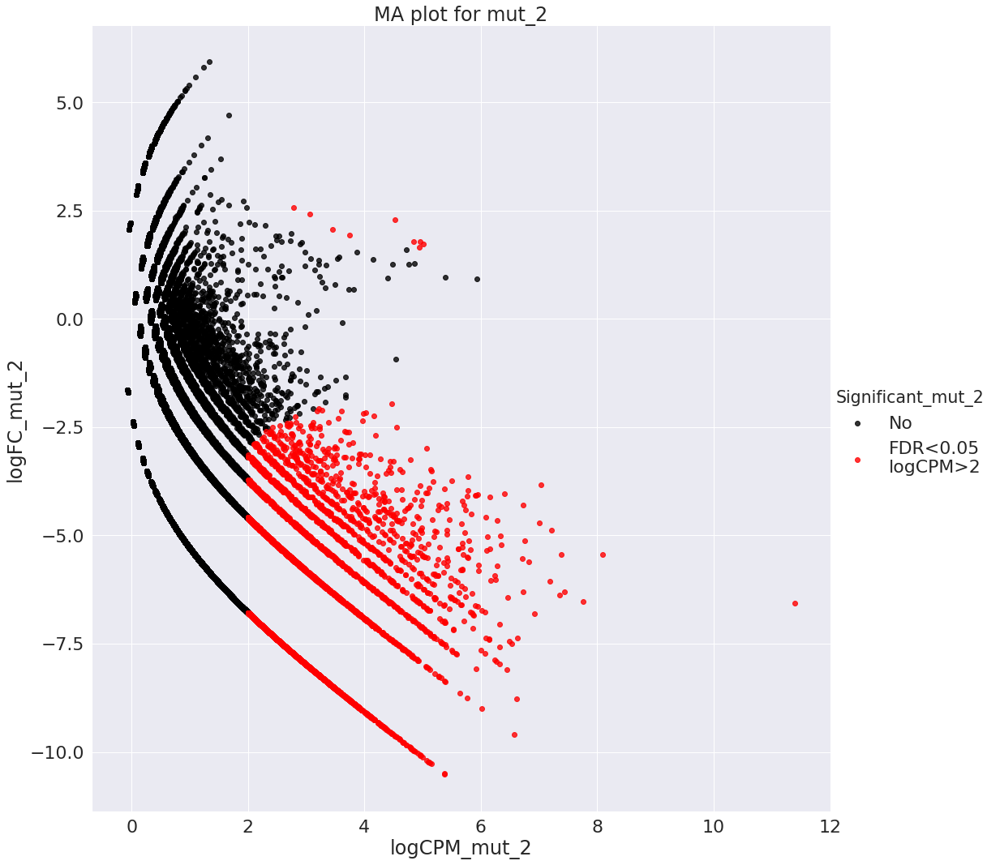

In [108]:
df_1_path = Dpf_3_null_path
df_2_path = mut_2_path
df_1_name = Dpf_3_null_name
df_2_name = mut_2_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,175005
FDR_mut_2<0.05\nlogCPM_mut_2>2,3795
FDR_Dpf_3_null<0.05\nFDR_mut_2<0.05\nlogCPM_Dpf_3_null>2\nlogCPM_mut_2>2,2794
FDR_Dpf_3_null<0.05\nlogCPM_Dpf_3_null>2,514


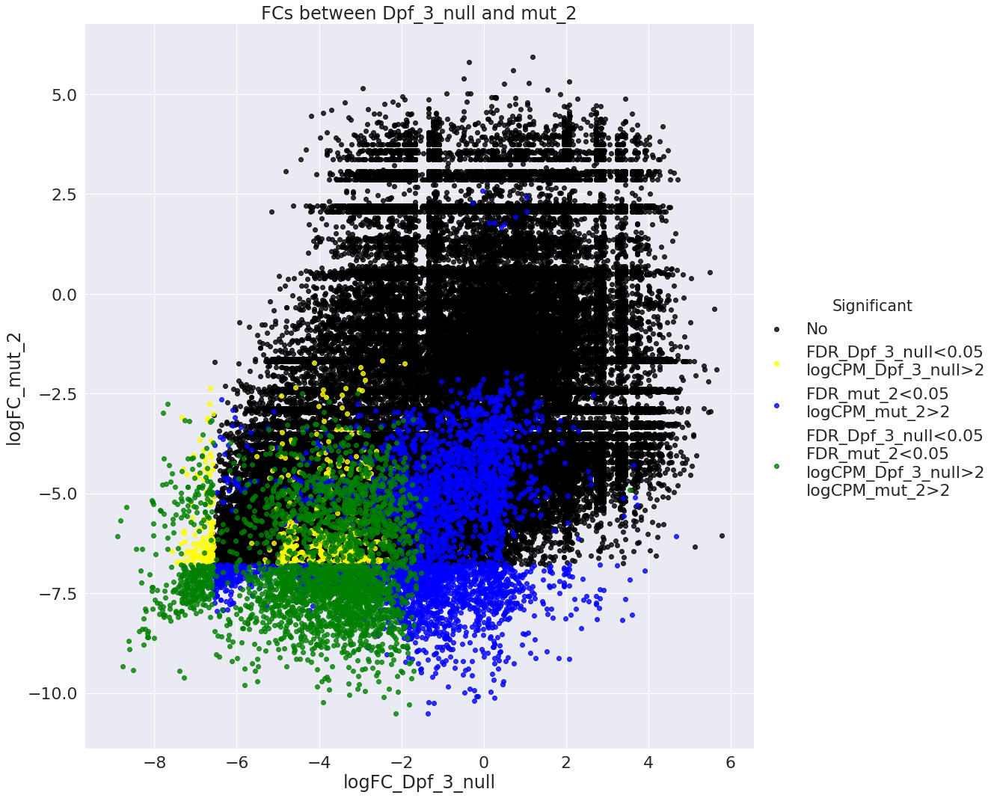

In [109]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 7. Dpf_3_null vs mut_7

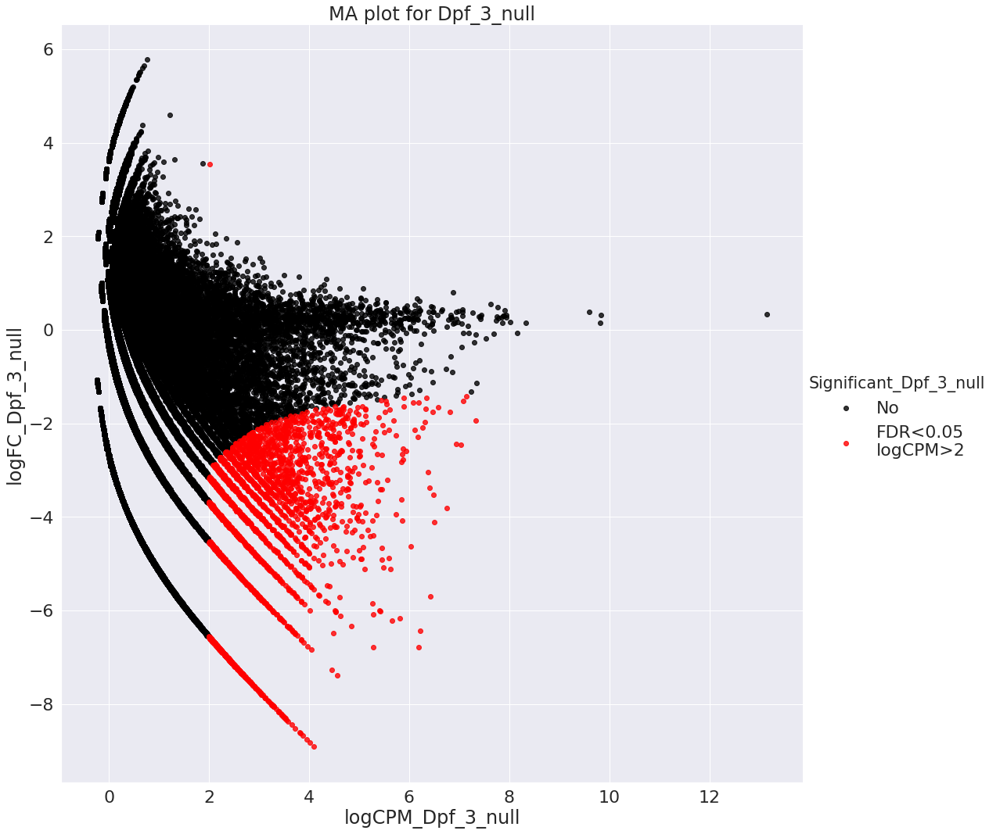

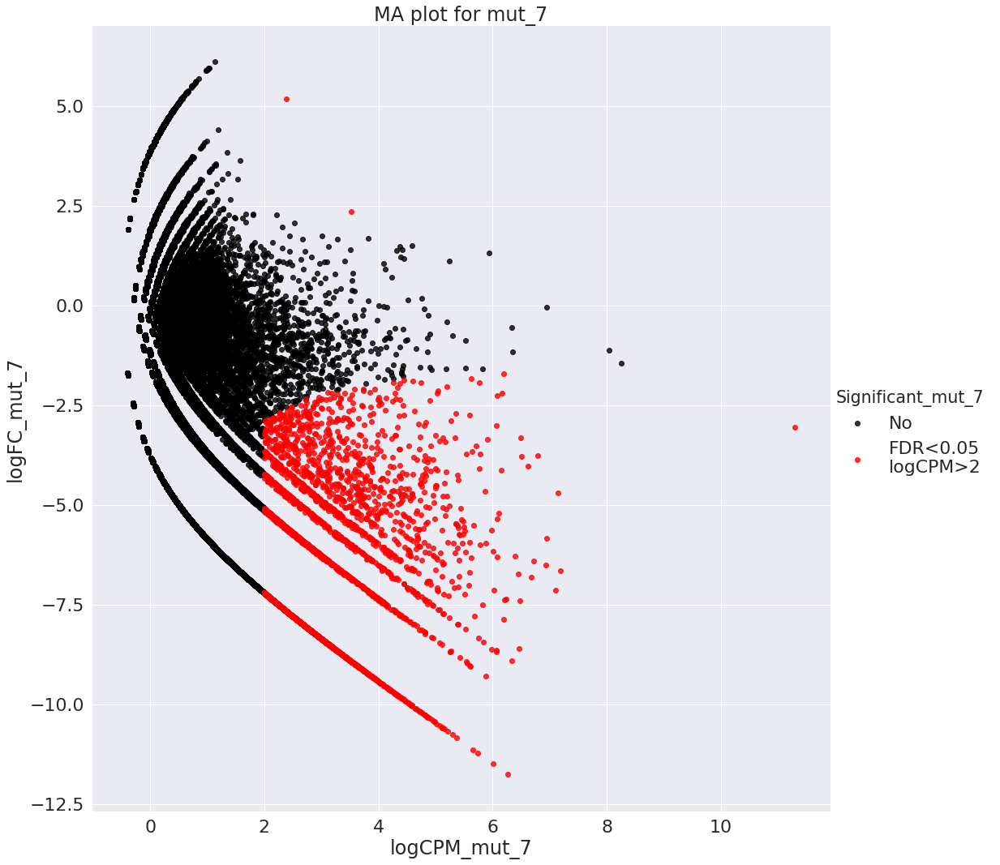

In [110]:
df_1_path = Dpf_3_null_path
df_2_path = mut_7_path
df_1_name = Dpf_3_null_name
df_2_name = mut_7_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,181141
FDR_Dpf_3_null<0.05\nFDR_mut_7<0.05\nlogCPM_Dpf_3_null>2\nlogCPM_mut_7>2,2372
FDR_mut_7<0.05\nlogCPM_mut_7>2,2339
FDR_Dpf_3_null<0.05\nlogCPM_Dpf_3_null>2,936


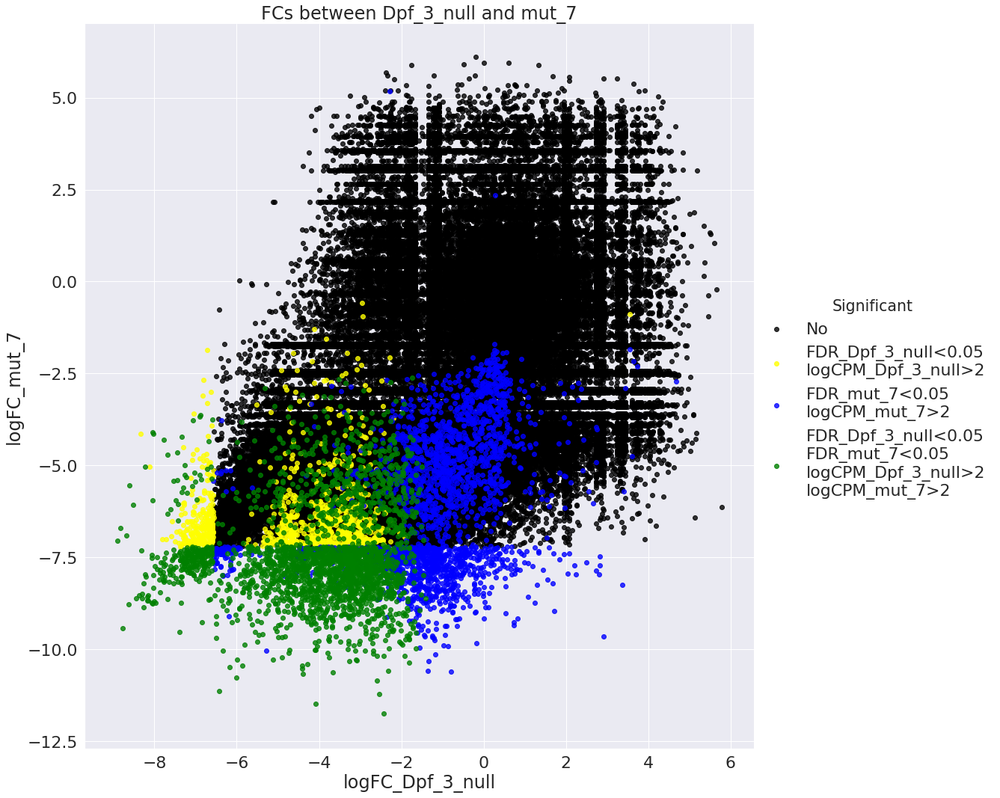

In [111]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 8. Dpf_3_Dpf_3_S784A vs mut_2

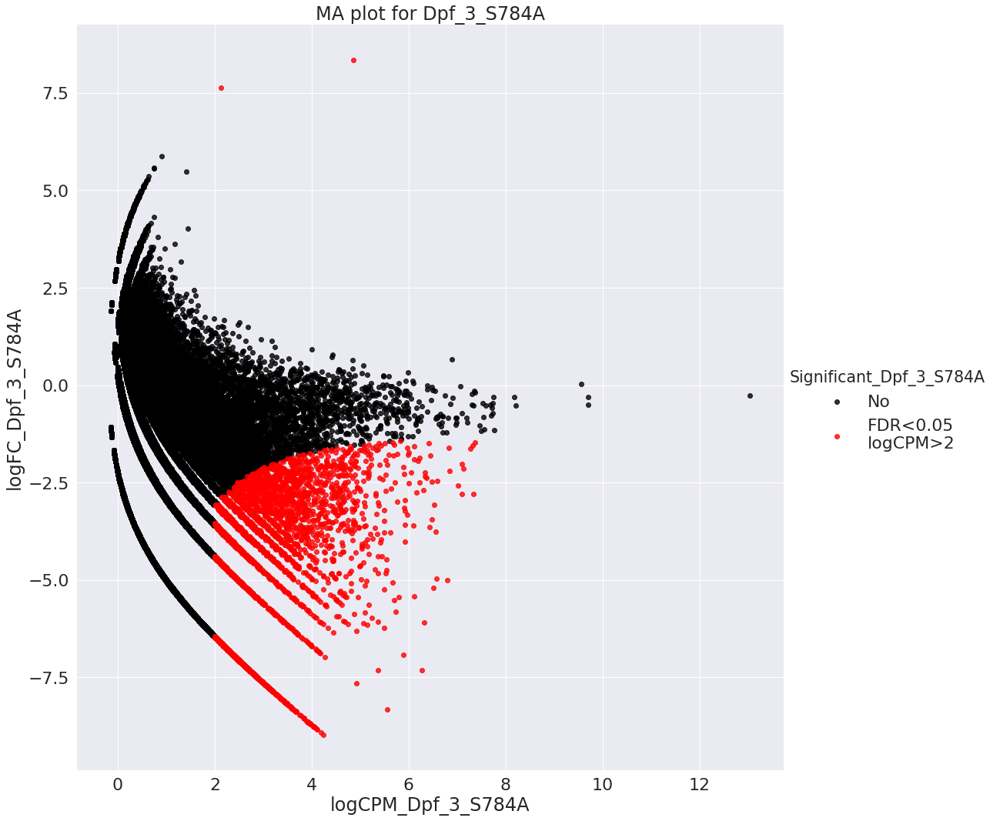

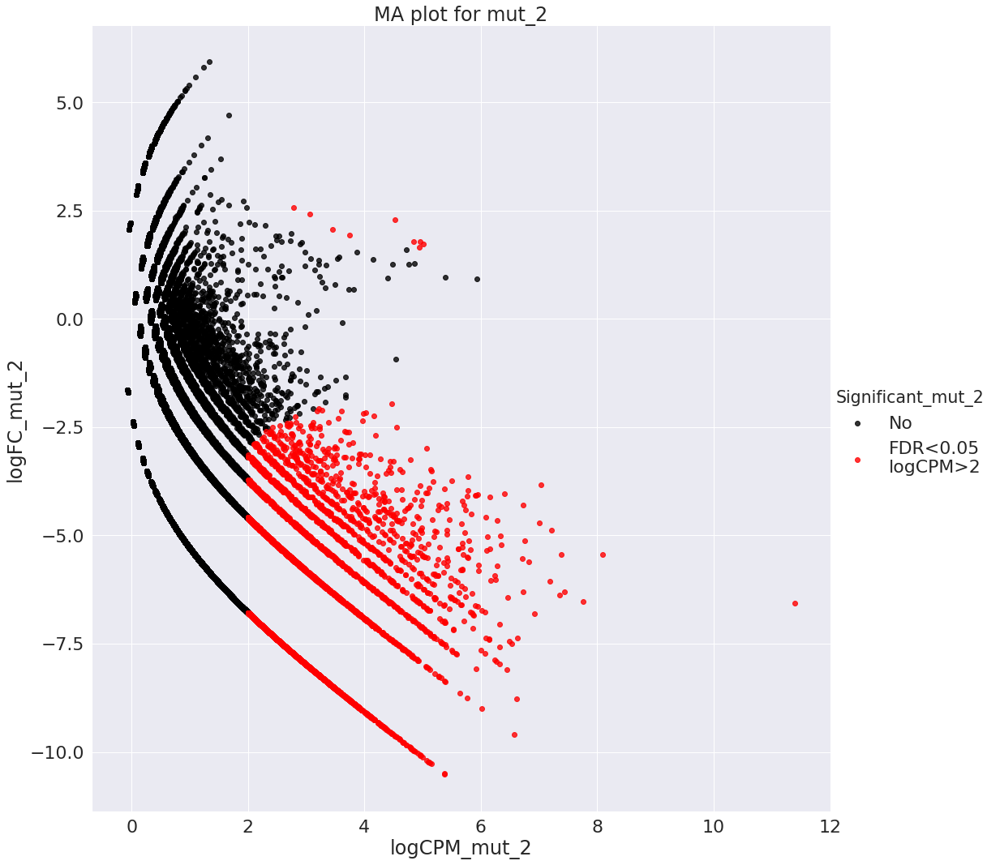

In [112]:
df_1_path = Dpf_3_S784A_path
df_2_path = mut_2_path
df_1_name = Dpf_3_S784A_name
df_2_name = mut_2_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,164457
FDR_Dpf_3_S784A<0.05\nFDR_mut_2<0.05\nlogCPM_Dpf_3_S784A>2\nlogCPM_mut_2>2,3337
FDR_mut_2<0.05\nlogCPM_mut_2>2,3238
FDR_Dpf_3_S784A<0.05\nlogCPM_Dpf_3_S784A>2,722


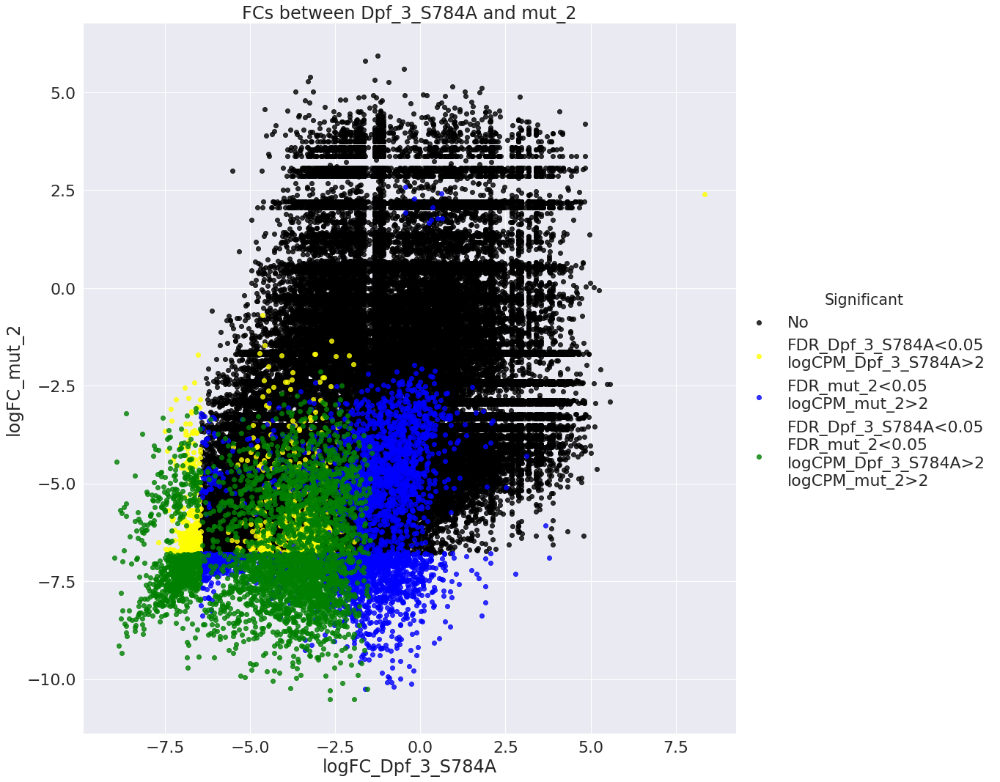

In [113]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 9. Dpf_3_Dpf_3_S784A vs mut_7

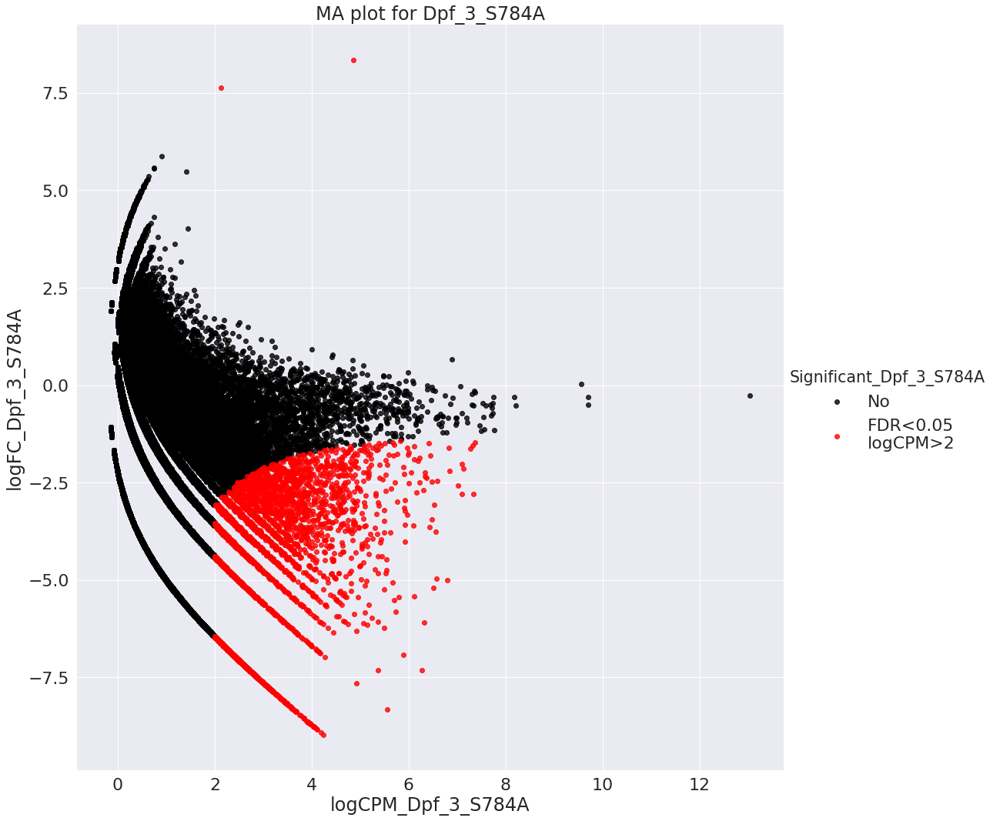

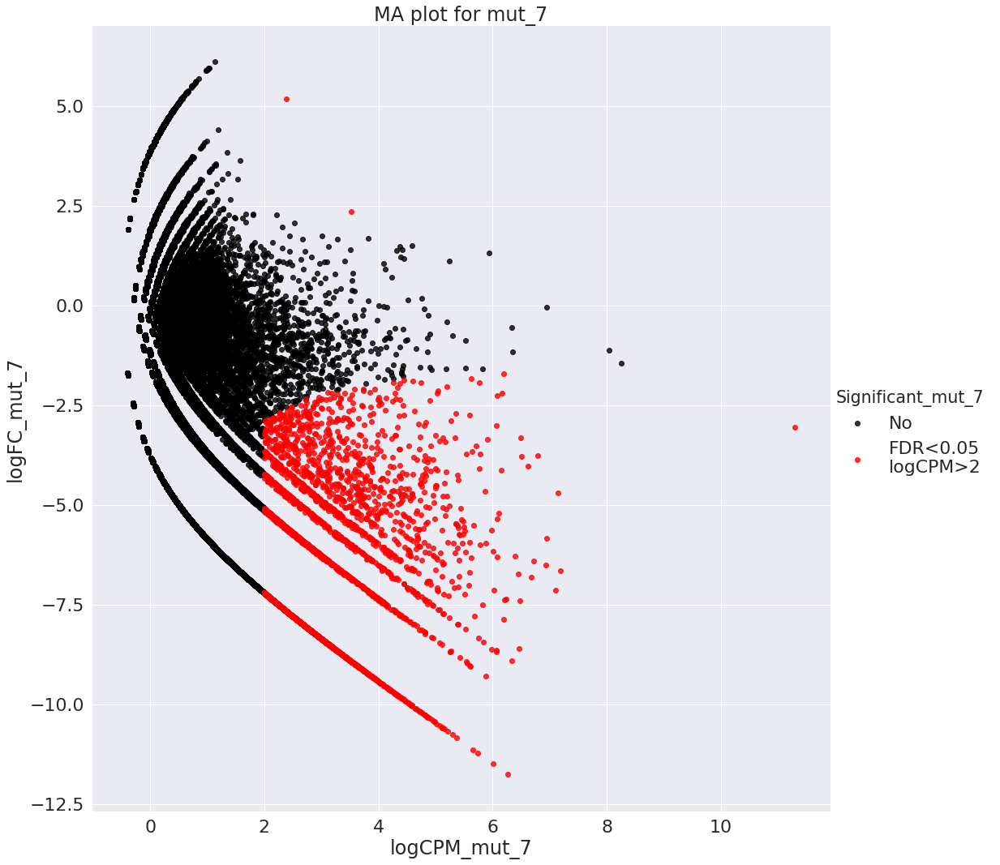

In [116]:
df_1_path = Dpf_3_S784A_path
df_2_path = mut_7_path
df_1_name = Dpf_3_S784A_name
df_2_name = mut_7_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,169787
FDR_Dpf_3_S784A<0.05\nFDR_mut_7<0.05\nlogCPM_Dpf_3_S784A>2\nlogCPM_mut_7>2,2824
FDR_mut_7<0.05\nlogCPM_mut_7>2,1877
FDR_Dpf_3_S784A<0.05\nlogCPM_Dpf_3_S784A>2,1236


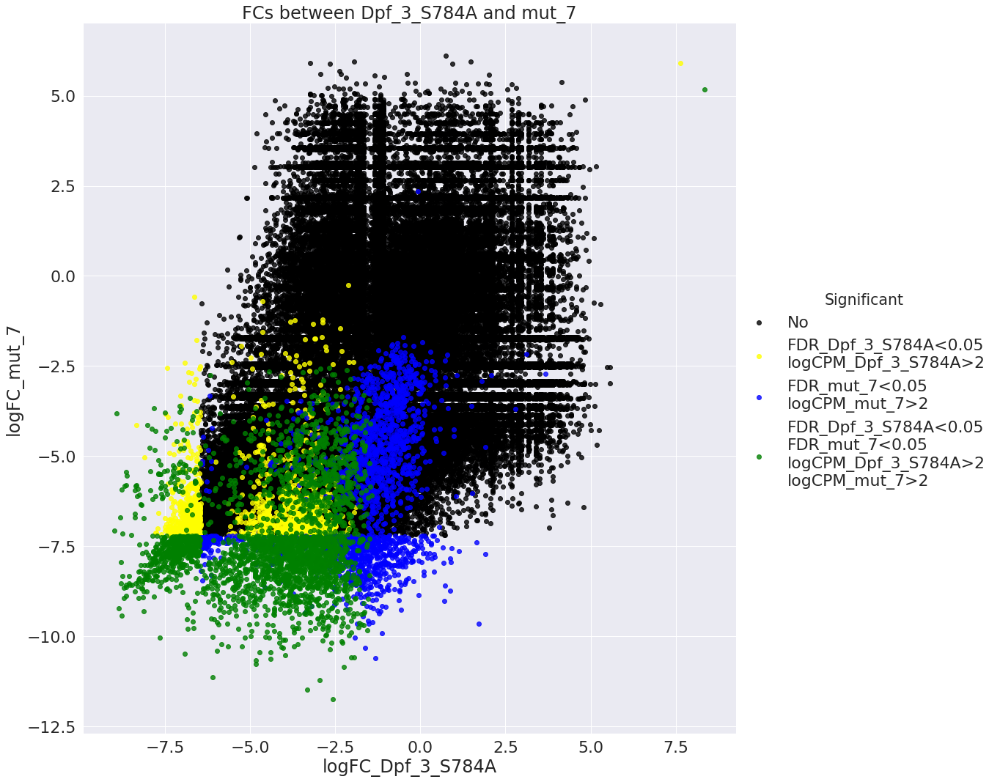

In [117]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 10. Dpf_3_null vs Dpf_3_null_old

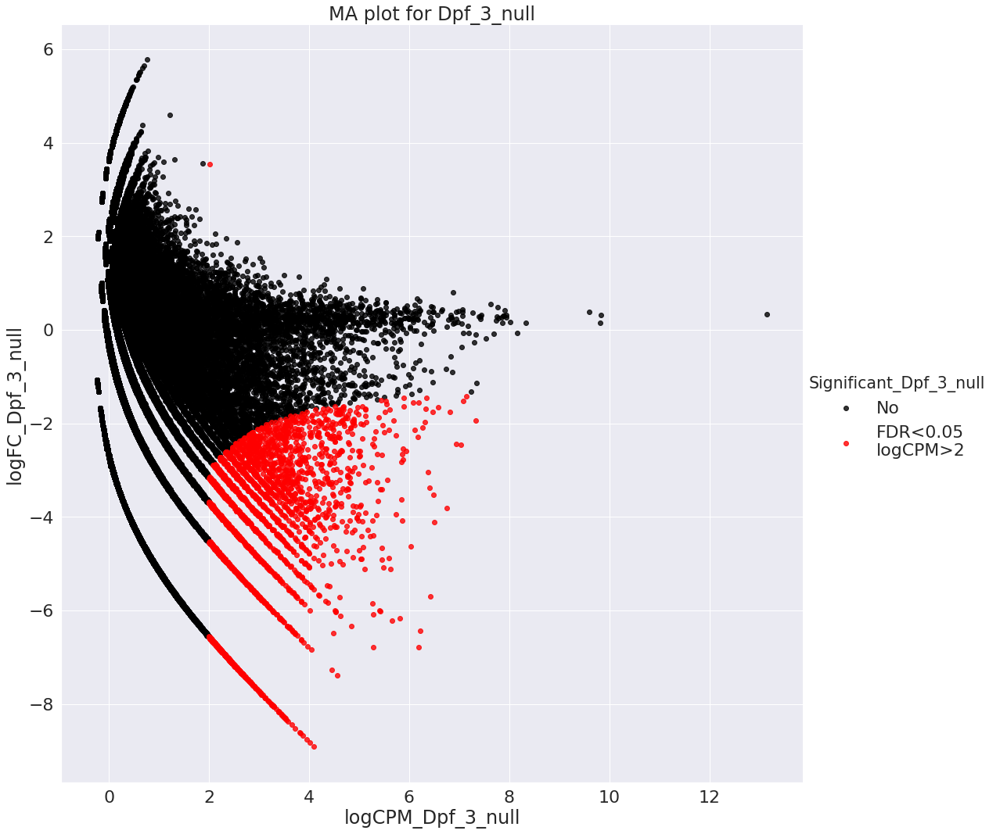

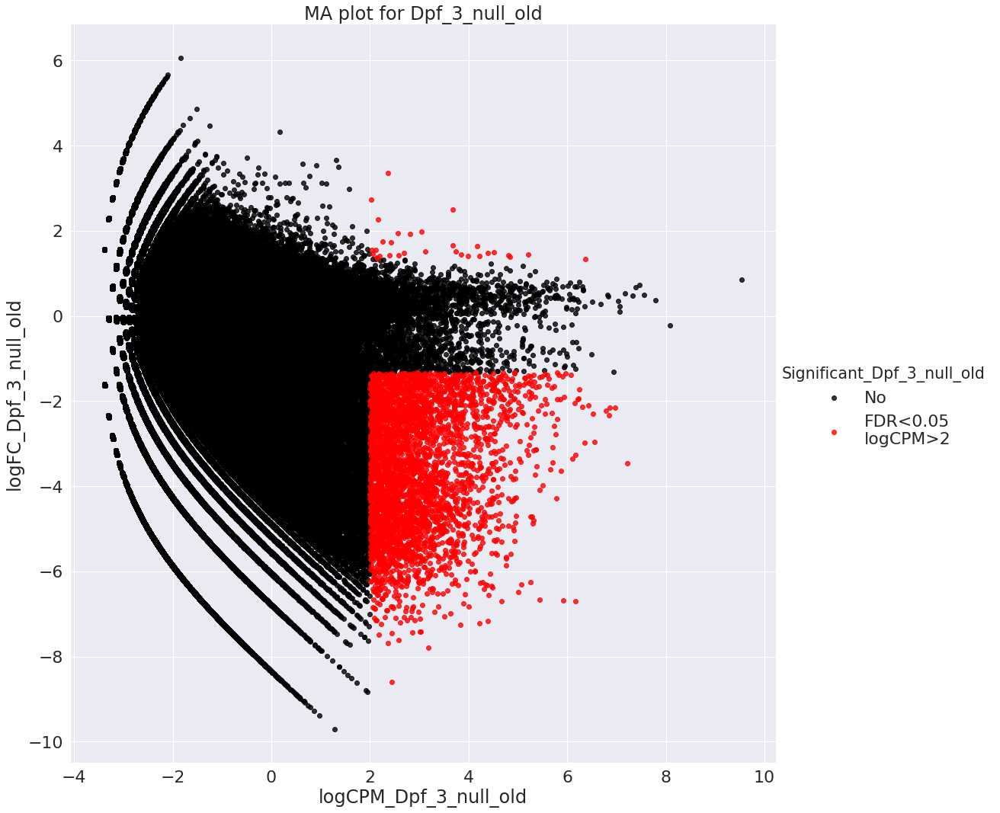

In [118]:
df_1_path = Dpf_3_null_path
df_2_path = Dpf_3_null_old_path
df_1_name = Dpf_3_null_name
df_2_name = Dpf_3_null_old_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,311859
FDR_Dpf_3_null_old<0.05\nlogCPM_Dpf_3_null_old>2,2356
FDR_Dpf_3_null<0.05\nlogCPM_Dpf_3_null>2,2210
FDR_Dpf_3_null<0.05\nFDR_Dpf_3_null_old<0.05\nlogCPM_Dpf_3_null>2\nlogCPM_Dpf_3_null_old>2,1090


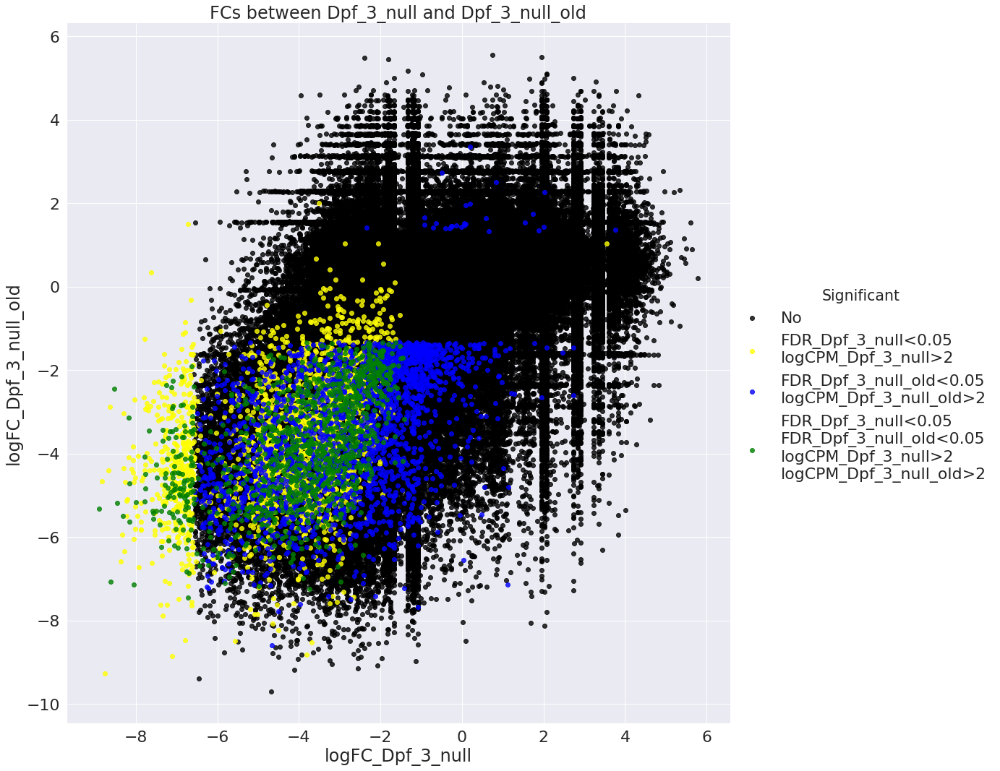

In [119]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())

## 11. Dpf_3_Dpf_3_S784A vs Dpf_3_Dpf_3_S784A old

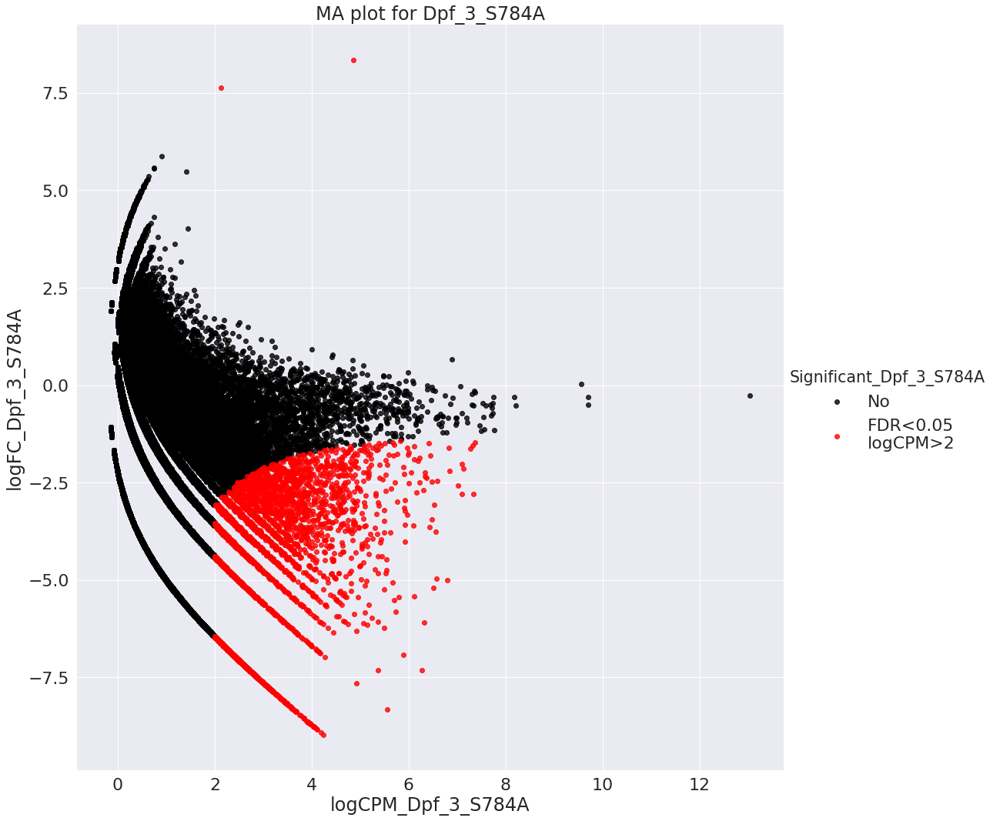

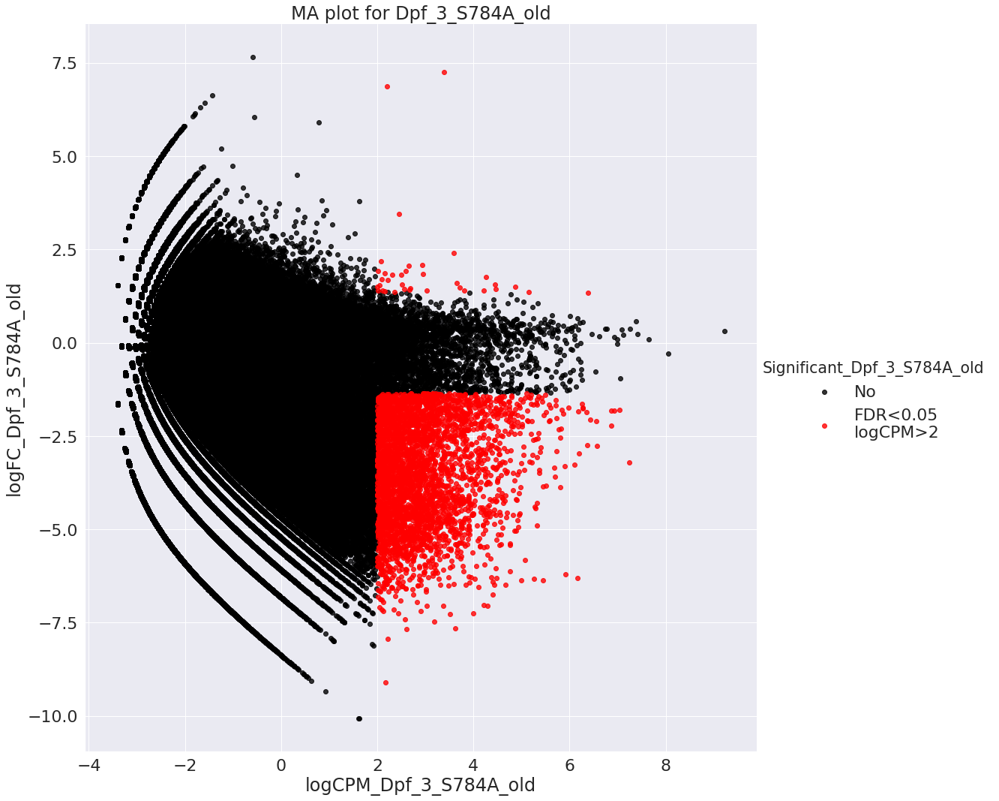

In [120]:
df_1_path = Dpf_3_S784A_path
df_2_path = dpf_3S784A_old_path
df_1_name = Dpf_3_S784A_name
df_2_name = dpf_3S784A_old_name

df_all = compare(df_1_path, df_2_path, df_1_name, df_2_name)

,Significant
No,286729
FDR_Dpf_3_S784A<0.05\nlogCPM_Dpf_3_S784A>2,2815
FDR_Dpf_3_S784A_old<0.05\nlogCPM_Dpf_3_S784A_old>2,2109
FDR_Dpf_3_S784A<0.05\nFDR_Dpf_3_S784A_old<0.05\nlogCPM_Dpf_3_S784A>2\nlogCPM_Dpf_3_S784A_old>2,1235


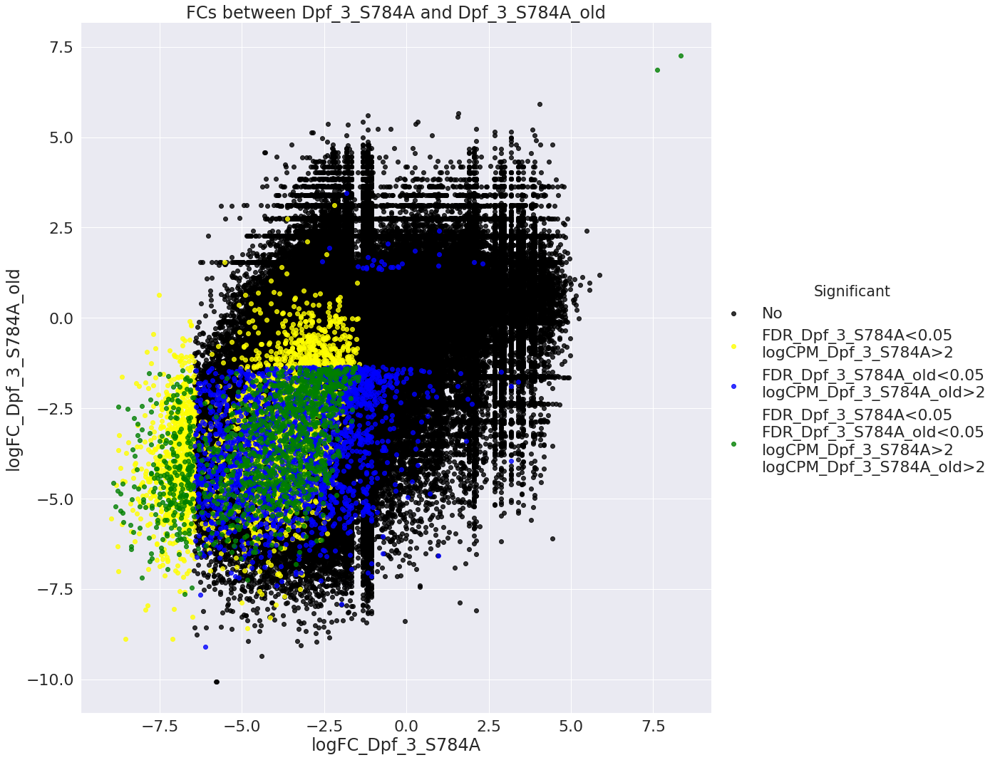

In [121]:
df_all["Significant"] = "No"

df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2),
            "Significant"] = f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2"


df_all.loc[(df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_2_name}"]>2),
            "Significant"] = f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2"


df_all.loc[(df_all[f"FDR_{df_1_name}"]<0.05) & 
           (df_all[f"FDR_{df_2_name}"]<0.05) &
           (df_all[f"logCPM_{df_1_name}"]>2) &
           (df_all[f"logCPM_{df_2_name}"]>2)
           , "Significant"] = f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"

plot_FC_correlation(df_all, df_1_name, df_2_name, hue="Significant", hue_order=["No", f"FDR_{df_1_name}<0.05\nlogCPM_{df_1_name}>2", f"FDR_{df_2_name}<0.05\nlogCPM_{df_2_name}>2", f"FDR_{df_1_name}<0.05\nFDR_{df_2_name}<0.05\nlogCPM_{df_1_name}>2\nlogCPM_{df_2_name}>2"])

pd.DataFrame(df_all["Significant"].value_counts())